# Sparse Registration Example

Tutorial for the new registration model with sparse DRRs:
- Sparse DRRs compute a random subset of the pixels in a DRR
- A loss can still be measured between the sparse DRR and a full image
- This loss can be used to guide gradient-based registration
- However there is a tradeoff: less information in the sparse DRR can result in less informative gradients

In [1]:
%load_ext lab_black

In [2]:
import csv
import time
from pathlib import Path

import click
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from IPython.display import HTML
from torch.nn import MSELoss
from torch.nn.functional import normalize
from tqdm import tqdm

from diffdrr import DRR, load_example_ct
from diffdrr.metrics import geodesic, XCorr2
from diffdrr.utils import reshape_subsampled_drr
from diffdrr.visualization import animate, plot_drr

from registration import get_true_drr, get_initial_parameters

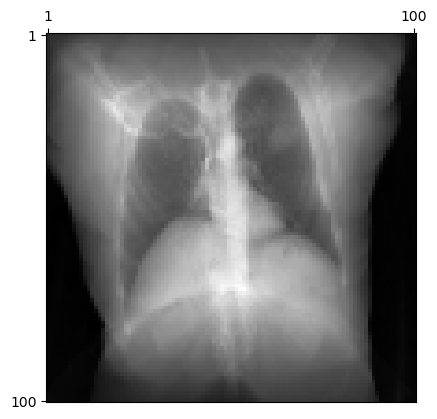

In [3]:
# Get the ground truth DRR
volume, spacing, true_params = get_true_drr()
drr_gt = DRR(volume, spacing, height=100, delx=10.0, device="cuda")
ground_truth = drr_gt(**true_params)

plot_drr(ground_truth)
plt.show()

tensor([221.5637], device='cuda:0', grad_fn=<AddBackward0>)


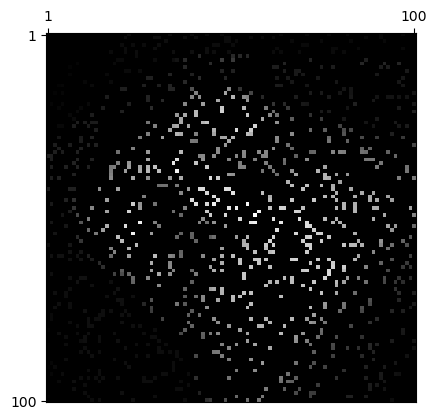

In [4]:
# Initialize the DRR and optimization parameters
sdr, theta, phi, gamma, bx, by, bz = get_initial_parameters(true_params)
drr_est = DRR(volume, spacing, height=100, delx=10.0, p_subsample=0.1, device="cuda")
estimate = drr_est(sdr, theta, phi, gamma, bx, by, bz)

print(geodesic(drr_gt, drr_est))

plot_drr(estimate)
plt.show()

In [5]:
def run_convergence_exp(
    n_itrs=10,
    drr=drr_est,
    ground_truth=ground_truth,
    true_params=true_params,
    filename="results/tmp.csv",
    debug=False,
    lr_rotations=5e-2,
    lr_translations=5e0,
    momentum=0.9,
    dampening=0.3,
):
    # Initialize the DRR and optimization parameters
    sdr, theta, phi, gamma, bx, by, bz = get_initial_parameters(true_params)
    _ = drr(sdr, theta, phi, gamma, bx, by, bz)  # Initialize the DRR generator

    # Criterion
    criterion = MSELoss()

    # Optimizer
    optimizer = torch.optim.Adam(
        [
            {"params": [drr.rotations], "lr": lr_rotations},
            {"params": [drr.translations], "lr": lr_translations},
        ],
    )

    with open(filename, "w") as f:

        # Start the training log
        writer = csv.writer(f, delimiter=",")
        writer.writerow(
            [
                "itr",
                "time",
                "loss",
                "geodesic",
                "theta",
                "phi",
                "gamma",
                "bx",
                "by",
                "bz",
            ]
        )
        t0 = time.perf_counter()

        # Start the training loop
        for itr in tqdm(range(n_itrs)):

            # Forward pass: compute the predicted DRR
            estimate = drr()
            t1 = time.perf_counter()

            # Compute the negative ZNCC as loss
            loss = criterion(ground_truth, estimate)
            geo_dist = geodesic(drr_gt, drr)
            theta, phi, gamma = drr.rotations.squeeze()
            bx, by, bz = drr.translations.squeeze()
            writer.writerow(
                [itr, t1 - t0]
                + [i.item() for i in [loss, geo_dist, theta, phi, gamma, bx, by, bz]]
            )

            if debug:
                if itr % 10 == 0:
                    tqdm.write(f"{itr}: {geo_dist.item()}")
            if geo_dist < 1e0:
                tqdm.write(f"Converged in {itr} iterations")
                break

            # Backward pass: update the weights
            optimizer.zero_grad()
            loss.backward(retain_graph=True)
            optimizer.step()
            t0 = t1

    return pd.read_csv(filename)

In [6]:
df = run_convergence_exp(150)

 47%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                       | 70/150 [00:01<00:01, 40.11it/s]

Converged in 70 iterations


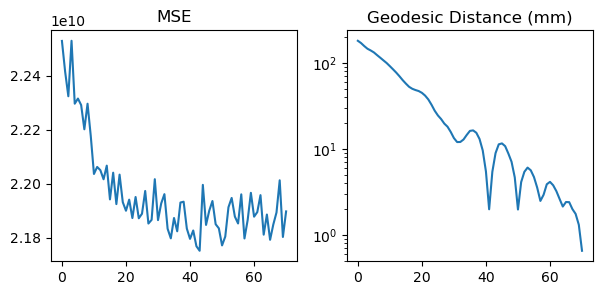

In [7]:
# Plot the training loss curves
fig, axs = plt.subplots(ncols=2, figsize=(7, 3))
axs[0].plot(df["loss"])
axs[0].set(title="MSE")

axs[1].plot(df["geodesic"])
axs[1].set_yscale("log")
axs[1].set(title="Geodesic Distance (mm)")
plt.show()

In [8]:
# Animate the sparse DRRs
HTML(animate(df, sdr=200.0, drr=drr_est, ground_truth=drr_gt(**true_params)))

Precomputing DRRs: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 71/71 [00:00<00:00, 178.23it/s]


In [9]:
# Animate the full DRR for the same camera poses as the sparse DRR
drr = DRR(volume, spacing, height=100, delx=10.0, reshape=True, device="cuda")
HTML(animate(df, sdr=200.0, drr=drr, ground_truth=drr(**true_params)))

Precomputing DRRs: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 71/71 [00:00<00:00, 81.26it/s]
